**🐶 Using Transfer Learning and TensorFlow 2.0 to Classify Different Dog Breeds**
Who's that doggy in the window?

Dogs are incredible. But have you ever been sitting at a cafe, seen a dog and not known what breed it is? I have. And then someone says, "it's an English Terrier" and you think, how did they know that?

In this project we're going to be using machine learning to help us identify different breeds of dogs.

To do this, we'll be using data from the Kaggle dog breed identification competition. It consists of a collection of 10,000+ labelled images of 120 different dog breeds.

This kind of problem is called multi-class image classification. It's multi-class because we're trying to classify mutliple different breeds of dog. If we were only trying to classify dogs versus cats, it would be called binary classification (one thing versus another).

Multi-class image classification is an important problem because it's the same kind of technology Tesla uses in their self-driving cars or Airbnb uses in atuomatically adding information to their listings.

Since the most important step in a deep learng problem is getting the data ready (turning it into numbers), that's what we're going to start with.

We're going to go through the following TensorFlow/Deep Learning workflow:


  1.   Get data ready (download from Kaggle, store, import).
  2.   Prepare the data (preprocessing, the 3 sets, X & y).
  3. Choose and fit/train a model (TensorFlow Hub, tf.keras.applications, TensorBoard, EarlyStopping).
  4. Evaluating a model (making predictions, comparing them with the ground truth labels).
  Improve the model through experimentation (start with 1000 images, make sure it works, increase the number of images).
  5. Save, sharing and reloading your model (once you're happy with the results).

For preprocessing our data, we're going to use TensorFlow 2.x. The whole premise here is to get our data into Tensors (arrays of numbers which can be run on GPUs) and then allow a machine learning model to find patterns between them.

For our machine learning model, we're going to be using a pretrained deep learning model from TensorFlow Hub.

The process of using a pretrained model and adapting it to your own problem is called transfer learning. We do this because rather than train our own model from scratch (could be timely and expensive), we leverage the patterns of another model which has been trained to classify images.

**Getting our workspace ready**
Before we get started, since we'll be using TensorFlow 2.x and TensorFlow Hub (TensorFlow Hub), let's import them.

NOTE: Don't run the cell below if you're already using TF 2.x.

In [ ]:
# Import TensorFlow into colab
import tensorflow as tf
import tensorflow_hub as hub

print("TF version :", tf.__version__)
print("TF version :", hub.__version__)

# Check for GPU availability
print("GPU" , "available (YES!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version : 2.12.0
TF version : 0.13.0
GPU available (YES!!!)


**Get our Workspace ready**
* Import TensorFlow 2.x ✅
* Import TensorFlow HUb
* Make Sure We are using a GPU





**Getting data ready**


  Since much of machine learning is getting your data ready to be used with a machine learning model, we'll take extra care getting it setup.

There are a few ways we could do this. Many of them are detailed in the Google Colab notebook on I/O (input and output).

And because the data we're using is hosted on Kaggle, we could even use the Kaggle API.

This is great but what if the data you want to use wasn't on Kaggle?

One method is to upload it to your Google Drive, mount your drive in this notebook and import the file.

In [ ]:
# checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/labels.csv")

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


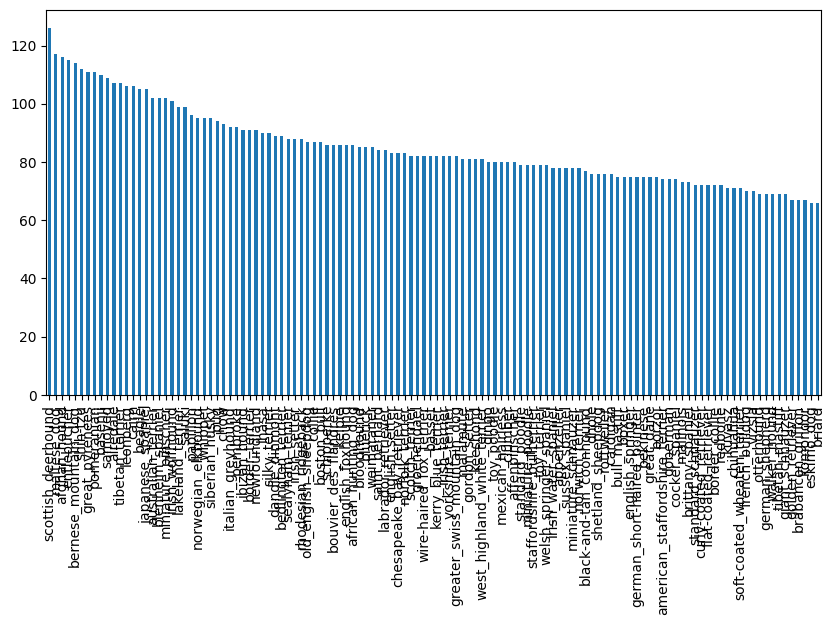

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot(kind="bar",figsize=(10,5));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

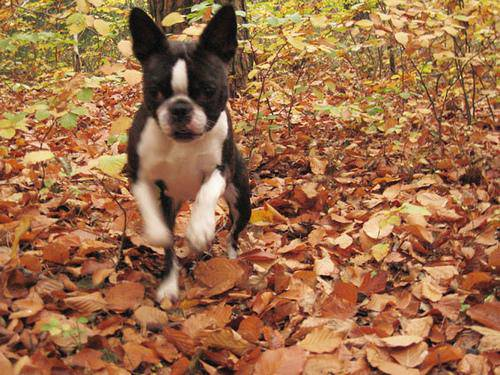

In [ ]:
# Lets view an image
from IPython.display import Image
Image("/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

Getting images and their labels
Since we've got the image ID's and their labels in a DataFrame (labels_csv), we'll use it to create:

* A list a filepaths to training images
* An array of all labels
* An array of all unique labels


We'll only create a list of filepaths to images rather than importing them all to begin with. This is because working with filepaths (strings) is much efficient than working with images.

In [ ]:
# Create Pthnames from image ID's
filenames = ["/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/"+ fname + ".jpg" for fname in labels_csv["id"]]

In [ ]:
#  check the first 10
filenames[:10]

['/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/002a283a315af96eaea0e28

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames do not match actual amount of files, check the target directory.


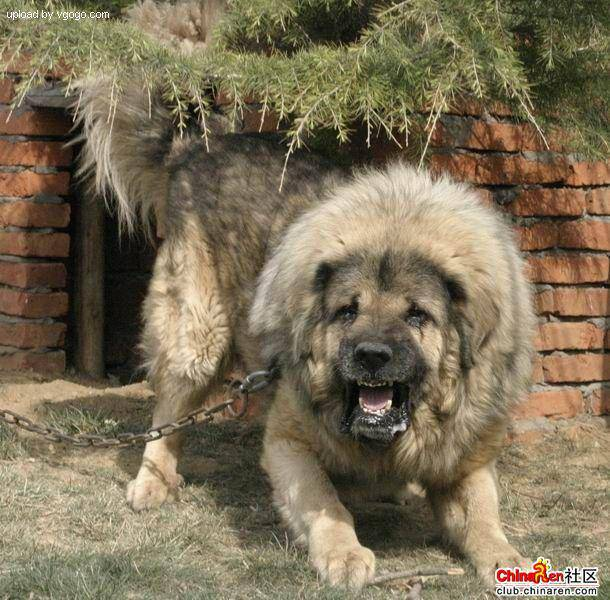

In [ ]:
Image(filenames[9000])

In [ ]:
filenames[9000]

'/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/e20e32bf114141e20a1af854ca4d0ecc.jpg'

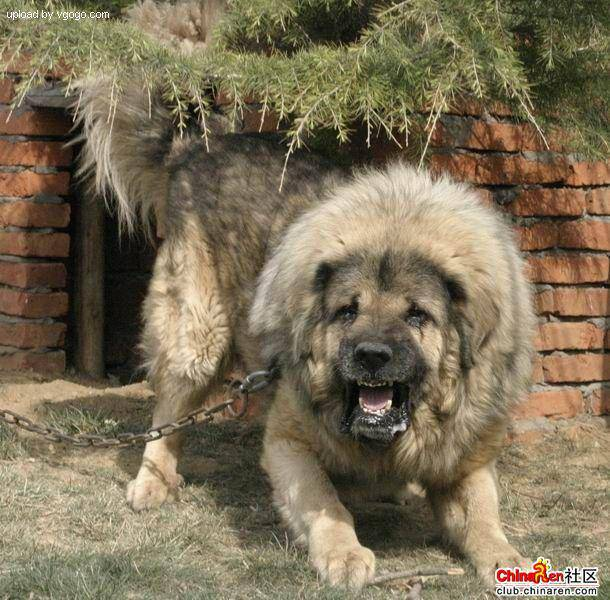

In [ ]:
Image("/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/"+labels_csv["id"][9000]+".jpg")

Since we have now got our training image filepaths in a list lets prepare our labes

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories.")

Number of labels matches number of filenames!


In [ ]:
unique_breeds = np.unique(labels)

In [ ]:
len(unique_breeds)

120

In [ ]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: Turning a boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])[0][0]) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


**Creating Our Own Validation set**


Since the dataset from Kaggle doesn't come with a validation set (a split of the data we can test our model on before making final predicitons on the test set), let's make one.

We could use Scikit-Learn's train_test_split function or we could simply make manual splits of the data.

For accessibility later, let's save our filenames variable to X (data) and our labels to y.

In [ ]:
#  Setup x and y variables
x = filenames
y = boolean_labels

Since we're working with 10,000+ images, it's a good idea to work with a portion of them to make sure things are working before training on them all.

This is because computing with 10,000+ images could take a fairly long time. And our goal when working through machine learning projects is to reduce the time between experiments.

Let's start experimenting with 1000 and increase it as we need.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

1000

In [ ]:
#  lets split our data into train and valiadation sets
from sklearn.model_selection import train_test_split

# split them into training and validation of total size NUM_IMAGes
x_train,x_val,y_train,y_val = train_test_split(x[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size= 0.2,
                                               random_state=42)

In [ ]:
x_train[:2],y_train[:2]

(['/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, 

## PreProcessing Images (turning images into Tensors)


Our labels are in numeric format but our images are still just file paths.

Since we're using TensorFlow, our data has to be in the form of Tensors.

A Tensor is a way to represent information in numbers. If you're familar with NumPy arrays (you should be), a Tensor can be thought of as a combination of NumPy arrays, except with the special ability to be used on a GPU.

Because of how TensorFlow stores information (in Tensors), it allows machine learning and deep learning models to be run on GPUs (generally faster at numerical computing).

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Takes an image filename as input.
2. Uses TensorFlow to read the file and save it to a variable, image.
3. Turn our image (a jpeg file) into Tensors.
4. Resize the image to be of shape (224, 224).
5. Return the modified image.


A good place to read about this type of function is the TensorFlow documentation on loading images.

You might be wondering why (224, 224), which is (heigh, width). It's because this is the size of input our model (we'll see this soon) takes, an image which is (224, 224, 3).

What? Where's the 3 from? We're getting ahead of ourselves but that's the number of colour channels per pixel, red, green and blue.

Let's make this a little more concrete.

In [ ]:
# define imager size
IMG_SIZE = 224

#create a function for preprocessing images
def process_image(image_path,img_size=IMG_SIZE) :
  """
  Takes an image file path and turns the image into a tensor
  """
  # read in an image
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with a 3 colour channel (Red,Blue,Green)
  image = tf.image.decode_jpeg(image,channels=3)
  # Coveret the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our desired value (244,244)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image

## Turning our data into batches


Creating data batches


Wonderful. Now we've got a function to convert our images into Tensors, we'll now build one to turn our data into batches (more specifically, a TensorFlow BatchDataset).

What's a batch?

A batch (also called mini-batch) is a small portion of your data, say 32 (32 is generally the default batch size) images and their labels. In deep learning, instead of finding patterns in an entire dataset at the same time, you often find them one batch at a time.

Let's say you're dealing with 10,000+ images (which we are). Together, these files may take up more memory than your GPU has. Trying to compute on them all would result in an error.

Instead, it's more efficient to create smaller batches of your data and compute on one batch at a time.

TensorFlow is very efficient when your data is in batches of (image, label) Tensors. So we'll build a function to do create those first. We'll take advantage of of process_image function at the same time.

In [ ]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image,label

Now we've got a simple function to turn our image file path names and their associated labels into tuples (we can turn these into Tensors next), we'll create a function to make data batches.

Because we'll be dealing with 3 different sets of data (training, validation and test), we'll make sure the function can accomodate for each set.

We'll set a default batch size of 32 because according to Yann Lecun (one of the OG's of deep learning), friends don't let friends train with batch sizes over 32

In [ ]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

Look at that! We've got our data in batches, more specifically, they're in Tensor pairs of (images, labels) ready for use on a GPU.

But having our data in batches can be a bit of a hard concept to understand. Let's build a function which helps us visualize what's going on under the hood.

## Visualizing data batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

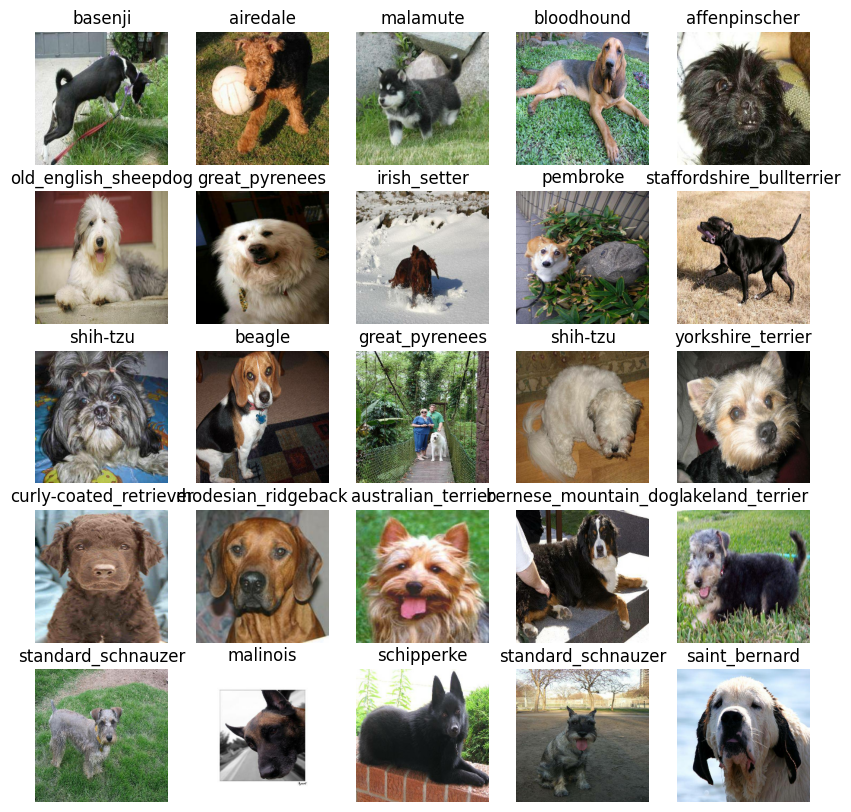

In [ ]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

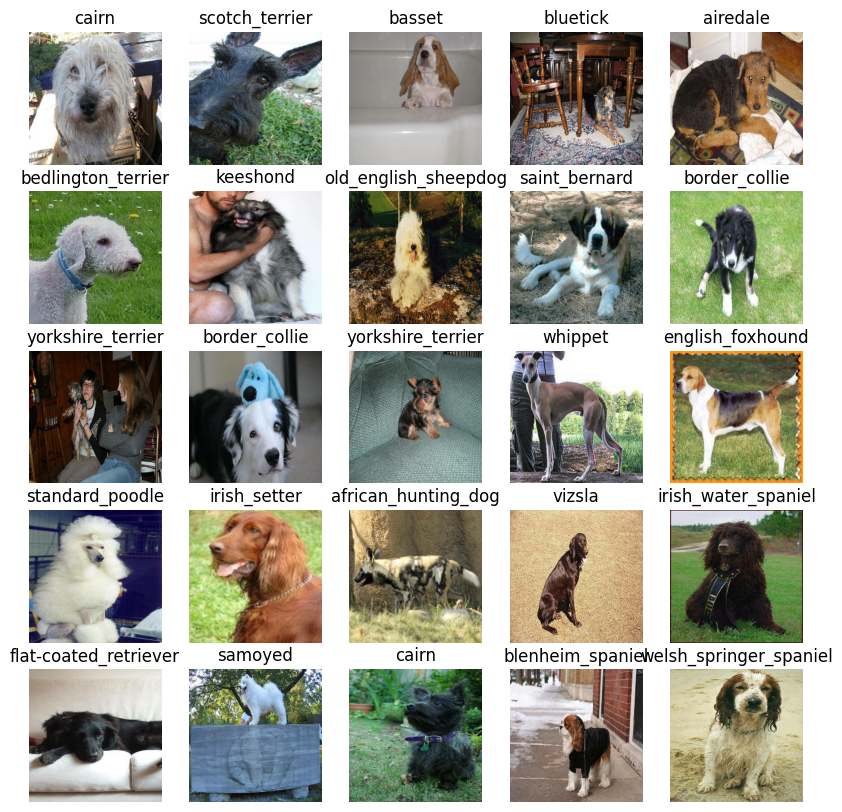

In [ ]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Creating and training a model
Now our data is ready, let's prepare it modelling. We'll use an existing model from TensorFlow Hub.

TensorFlow Hub is a resource where you can find pretrained machine learning models for the problem you're working on.

Using a pretrained machine learning model is often referred to as transfer learning.

Why use a pretrained model?
Building a machine learning model and training it on lots from scratch can be expensive and time consuming.

Transfer learning helps eliviate some of these by taking what another model has learned and using that information with your own problem.

How do we choose a model?
Since we know our problem is image classification (classifying different dog breeds), we can navigate the TensorFlow Hub page by our problem domain (image).

We start by choosing the image problem domain, and then can filter it down by subdomains, in our case, image classification.

Doing this gives a list of different pretrained models we can apply to our task.

Clicking on one gives us information about the model as well as instructions for using it.

For example, clicking on the mobilenet_v2_130_224 model, tells us this model takes an input of images in the shape 224, 224. It also says the model has been trained in the domain of image classification.

Let's try it out.

Building a model
Before we build a model, there are a few things we need to define:

The input shape (images, in the form of Tensors) to our model.
The output shape (image labels, in the form of Tensors) of our model.
The URL of the model we want to use.
These things will be standard practice with whatever machine learning model you use. And because we're using TensorFlow, everything will be in the form of Tensors.

## Building a model
Before we build a model, there are a few things we need to define:

* The input shape (images, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.
These things will be standard practice with whatever machine learning model you use. And because we're using TensorFlow, everything will be in the form of Tensors.

In [ ]:
  # Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got the inputs, outputs and model we're using ready to go. We can start to put them together

There are many ways of building a model in TensorFlow but one of the best ways to get started is to use the Keras API.

Defining a deep learning model in Keras can be as straightforward as saying, "here are the layers of the model, the input shape and the output shape, let's go!"

Knowing this, let's create a function which:

Takes the input shape, output shape and the model we've chosen's URL as parameters.
Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
Compiles the model (says how it should be evaluated and improved).
Builds the model (tells it what kind of input shape it'll be getting).
Returns the model.
We'll take a look at the code first, then dicuss each part.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

## TensorBoard Callback
TensorBoard helps provide a visual way to monitor the progress of your model during and after training.

It can be used directly in a notebook to track the performance measures of a model such as loss and accuracy.

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize the our models training logs using the %tensorboard magic function (we'll do this later on).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard


In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback
Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).

It's basically like saying to our model, "keep finding patterns until the quality of those patterns starts to go down."

In [ ]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

## Training a model (on a subset of data)


Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.

We do this to make sure everything is working. And if it is, we can step it up later and train on the entire training dataset.

The final parameter we'll define before training is NUM_EPOCHS (also known as number of epochs).

NUM_EPOCHS defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.

If NUM_EPOCHS=1, the model will only look at the data once and will probably score badly because it hasn't a chance to correct itself. It would be like you competing in the international hill descent championships and your friend Adam only being able to give you 1 single instruction to get down the hill.

What's a good value for NUM_EPOCHS?

This one is hard to say. 10 could be a good start but so could 100. This is one of the reasons we created an early stopping callback. Having early stopping setup means if we set NUM_EPOCHS to 100 but our model stops improving after 22 epochs, it'll stop training.

Along with this, let's quickly check if we're still using a GPU.



In [ ]:
NUM_EPOCHS = 100 #@param {type : "slider",min:10, max : 100, step:10}

In [ ]:
# Check again if GPU is available (otherwise computing will take a looooonnnnggggg time)
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


Lets create a function which train a model.

* Create a model using `create_model()`
* create_tensorboard_callback() (we do this here so * * it creates a log directory of the current date and
 time).
* Call the fit() function on our model passing it the * training data, validatation data, number of epochs  
 to train for and the callbacks we'd like to use.
* Return the fitted model.

In [ ]:
# Build a functionn to train and return a trained model
def train_model():
  """
  Train a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # create a new tensoeborad session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the moel to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  # retunthe fitted model
  return model

In [ ]:
# fit thwe model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 148s 5s/step - loss: 4.6271 - accuracy: 0.0887 - val_loss: 3.3683 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 141ms/step - loss: 1.6252 - accuracy: 0.7125 - val_loss: 2.1390 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 4s 142ms/step - loss: 0.5600 - accuracy: 0.9438 - val_loss: 1.7335 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - 3s 119ms/step - loss: 0.2491 - accuracy: 0.9887 - val_loss: 1.5509 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 3s 139ms/step - loss: 0.1441 - accuracy: 0.9987 - val_loss: 1.4756 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 4s 144ms/step - loss: 0.1002 - accuracy: 0.9987 - val_loss: 1.4246 - val_accuracy: 0.6150
Epoch 7/100
25/25 [==============================]

**Checking the TensorBoard logs**


Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and viualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/dog-vision/dog-breed-identification.zip\ (Unzipped\ Files)logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model
Before we scale up and train on more data, let's see some other ways we can evaluate our model. Because although accuracy is a pretty good indicator of how our model is doing, it would be even better if we could could see it in action.

Making predictions with a trained model is as calling predict() on it and passing it data in the same format the model was trained on.

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 2s 149ms/step


array([[2.47918710e-04, 8.60220389e-05, 2.10238202e-03, ...,
        3.31203744e-04, 4.75870183e-06, 1.77671737e-03],
       [4.50962078e-04, 5.45809336e-04, 7.95716047e-03, ...,
        1.12775411e-03, 2.19532312e-03, 7.11579414e-05],
       [1.48619699e-06, 4.51143342e-06, 2.45169440e-06, ...,
        1.81785549e-06, 3.38715581e-05, 3.98419579e-05],
       ...,
       [1.44761943e-05, 1.83144311e-05, 5.89062169e-04, ...,
        1.41624205e-05, 7.03561585e-04, 4.16020594e-05],
       [3.34344129e-03, 2.64724280e-04, 9.54927018e-05, ...,
        2.54089129e-04, 2.05572105e-05, 1.97030418e-02],
       [2.35272601e-04, 1.80593033e-05, 3.61690705e-04, ...,
        2.13431427e-03, 4.14825045e-04, 4.90384773e-05]], dtype=float32)

In [ ]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[2.47918710e-04 8.60220389e-05 2.10238202e-03 5.89321535e-05
 6.69174697e-05 2.22230246e-05 2.64821295e-02 1.48757535e-04
 1.29427126e-05 6.65484113e-04 1.08592605e-04 1.33620808e-04
 1.19003416e-04 5.35371400e-05 2.89334334e-04 2.37159213e-04
 1.57427043e-04 3.68835151e-01 3.23193599e-05 7.77631431e-05
 5.45904113e-05 4.42648088e-05 5.63163394e-06 1.06889463e-03
 7.93717845e-05 2.14910964e-04 3.02646011e-02 1.20538371e-05
 1.74657078e-04 2.57447537e-04 2.13144478e-04 2.23145797e-03
 4.79193841e-04 3.83377665e-06 1.58144074e-04 1.28946742e-02
 3.45810149e-05 3.64748084e-05 1.20150522e-04 2.02801471e-04
 2.94450787e-04 3.38491009e-06 1.27728608e-05 1.47597006e-04
 2.67376458e-06 1.48711872e-04 5.60319268e-06 2.20985137e-04
 3.92335467e-03 8.70504882e-05 9.45830179e-05 9.93297654e-05
 3.08201474e-04 5.61824163e-05 1.46353123e-04 1.15484276e-04
 1.67280363e-04 6.68480468e-04 7.08011794e-05 3.30234110e-01
 4.03787817e-05 6.48091418e-06 3.92194634e-04 9.39561687e-06
 2.11247811e-04 4.639467

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[9])
pred_label

'collie'

Wonderful! Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

Remember, the model hasn't trained on the validation data, during the fit() function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels.

Since our validation data (val_data) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using unbatch()) and then turn it into an iterator using as_numpy_iterator().

In [ ]:
# Create a function to unbatch  batch dataset
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we have got ways to get:

* prediction labels
* Validation labels (truth labels)
* validation images

Let's make some function these all a bit more visualization

We createb a function which:
* Takes an array of prediction probabilties, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

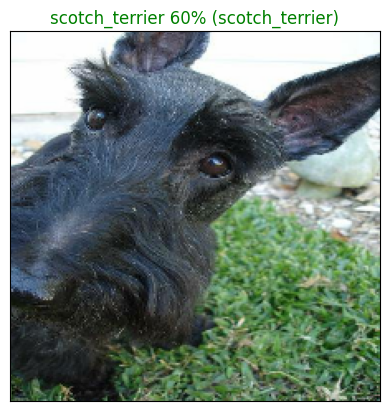

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

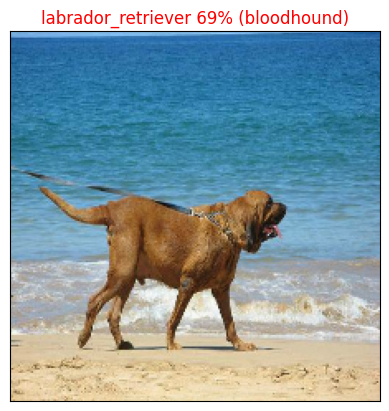

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,n=100)

Nice! Making functions to help visual your models results are really helpful in understanding how your model is doing.

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:

Take an input of a prediction probabilities array, a ground truth labels array and an integer.
Find the predicted label using get_pred_label().
Find the top 10:
* Prediction probabilities indexes
* Prediction probabilities values
Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

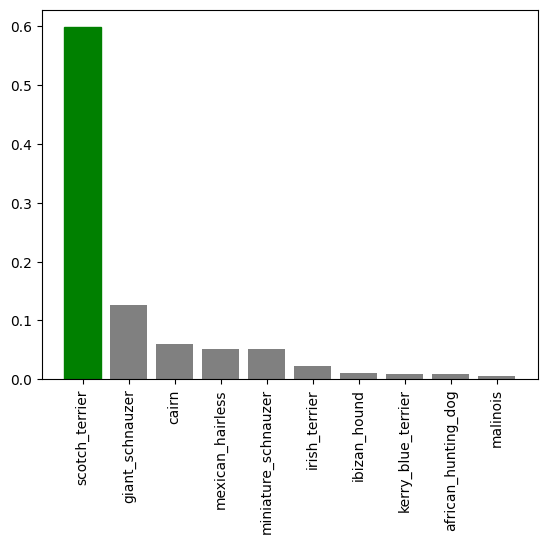

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=1)

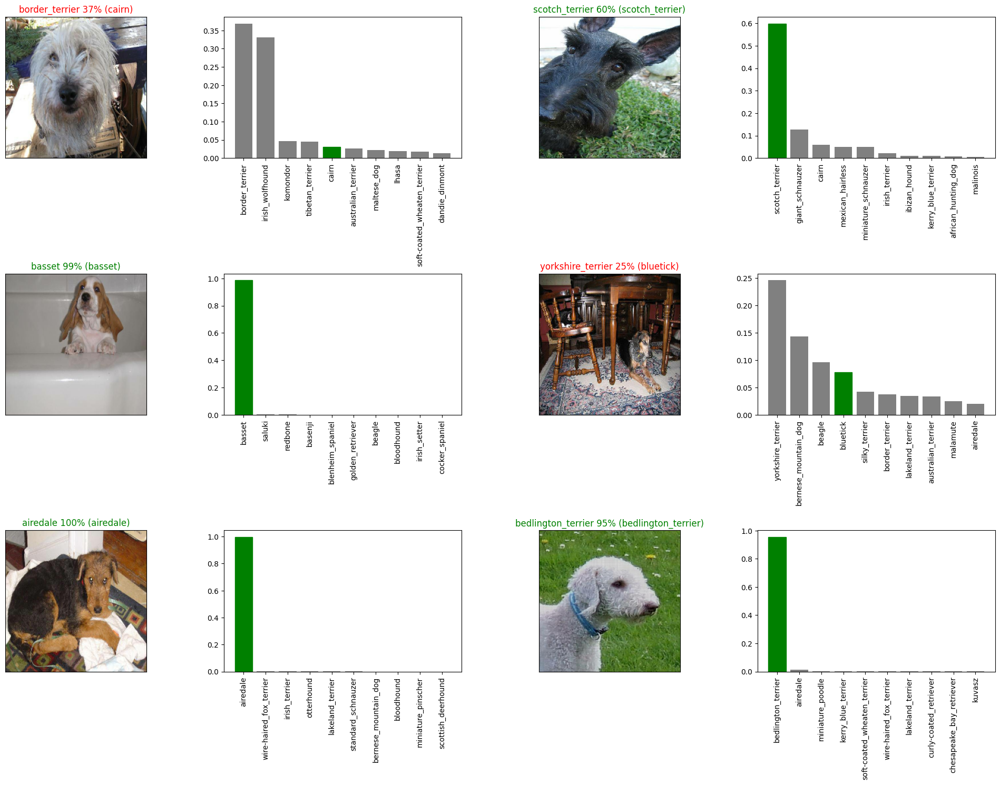

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a model
After training a model, it's a good idea to save it. Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it.

The format of an entire saved Keras model is h5. So we'll make a function which can take a model as input and utilise the save() method to save it as a h5 file to a specified directory.

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("/content/drive/MyDrive/dog-vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path



In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: /content/drive/MyDrive/dog-vision/models/20230704-04131688444017-1000-images-Adam.h5...


'/content/drive/MyDrive/dog-vision/models/20230704-04131688444017-1000-images-Adam.h5'

In [ ]:

# Load our model trained on 1000 images
model_1000_images = load_model('/content/drive/MyDrive/dog-vision/models/20230703-03131688354006-1000-images-Adam.h5')

Loading saved model from: /content/drive/MyDrive/dog-vision/models/20230703-03131688354006-1000-images-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 78ms/step - loss: 1.2819 - accuracy: 0.6500


[1.2818602323532104, 0.6499999761581421]

In [ ]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 84ms/step - loss: 1.1809 - accuracy: 0.7000


[1.180871844291687, 0.699999988079071]

In [ ]:
# Training big dog model (on the Full data)
len(x),len(y)

(10222, 10222)

In [ ]:
x[:10]

['/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/train/002a283a315af96eaea0e28

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(x,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create a full model  callback
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training a all the data, so cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 105ms/step - loss: 1.3227 - accuracy: 0.6737
Epoch 2/100
320/320 [==============================] - 33s 102ms/step - loss: 0.3992 - accuracy: 0.8814
Epoch 3/100
320/320 [==============================] - 33s 102ms/step - loss: 0.2363 - accuracy: 0.9367
Epoch 4/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1553 - accuracy: 0.9618
Epoch 5/100
320/320 [==============================] - 33s 102ms/step - loss: 0.1056 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0775 - accuracy: 0.9863
Epoch 7/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0574 - accuracy: 0.9927
Epoch 8/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0469 - accuracy: 0.9940
Epoch 9/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0387 - accuracy: 0.9949
Epoch 10/100
320/320 [==============================] - 34s 105m

In [ ]:
save_model(full_model,suffix="all-images-Adam")

Saving model to: /content/drive/MyDrive/dog-vision/models/20230704-04511688446288-all-images-Adam.h5...


'/content/drive/MyDrive/dog-vision/models/20230704-04511688446288-all-images-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/dog-vision/models/20230704-04511688446288-all-images-Adam.h5')

Loading saved model from: /content/drive/MyDrive/dog-vision/models/20230704-04511688446288-all-images-Adam.h5


## Making prediction on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames.
* Convert the filenames into test data batches using  create_data_batches() and setting the test_data parameter to True (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the predict() function.

In [ ]:
#  LOad atest images filenames
test_path= "/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/test/e1c6c50bbaee219e7faf29e9c1c343ca.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/test/e7afcce6e45858fc3b294cc5c0b15a53.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/test/e17512584de423da7fc17bfb2c7548ae.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/test/df47feaaf3dfb33cf712cccdddc8060e.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/test/e34654831e228ad3ac1d0c463e70caf6.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/test/e3baf6b2914677edd2729db0f32e2620.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/test/e1b0cbcf3235fe9a7b35c1652081ff8d.jpg',
 '/content/drive/MyDrive/dog-vision/dog-breed-identification.zip (Unzipped Files)/test/dcdffa00518844bd21499db49979f9c

In [ ]:
len(test_filenames)

10359

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 997s 3s/step


** preparing test dataset prediction for kaggle **

Looking at the Kaggle sample submission, it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the unique_breeds list and the test_predictions list.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame

preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1c6c50bbaee219e7faf29e9c1c343ca,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e7afcce6e45858fc3b294cc5c0b15a53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e17512584de423da7fc17bfb2c7548ae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,df47feaaf3dfb33cf712cccdddc8060e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e34654831e228ad3ac1d0c463e70caf6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1c6c50bbaee219e7faf29e9c1c343ca,9.995303e-01,1.369262e-07,1.402314e-09,1.277621e-12,1.481189e-14,2.119076e-14,1.855874e-08,7.002993e-12,4.882059e-11,...,1.793213e-07,2.176359e-13,3.113673e-10,1.318552e-11,7.280687e-11,2.097099e-14,8.072716e-13,4.601101e-12,2.124389e-11,3.108990e-05
1,e7afcce6e45858fc3b294cc5c0b15a53,9.860358e-02,1.258622e-08,3.857273e-09,1.001372e-10,1.210459e-09,4.386273e-12,2.792907e-06,6.909522e-11,8.329352e-12,...,1.840657e-06,1.427544e-08,7.000654e-08,1.079733e-09,6.350412e-10,3.107402e-13,7.822535e-13,1.811882e-09,1.283262e-08,6.175549e-07
2,e17512584de423da7fc17bfb2c7548ae,9.716419e-11,3.096499e-11,2.567249e-11,2.496682e-08,6.542479e-05,1.070873e-07,9.318418e-11,3.085263e-10,3.484728e-08,...,2.805213e-10,1.258963e-09,2.452162e-05,1.147435e-04,1.744136e-04,2.228280e-10,2.734510e-09,3.932027e-09,5.935363e-10,5.178619e-12
3,df47feaaf3dfb33cf712cccdddc8060e,2.120472e-08,6.349789e-11,1.155458e-09,1.530760e-11,6.769783e-10,1.557194e-14,3.606060e-08,5.904240e-07,3.238792e-10,...,1.003540e-10,3.832071e-07,1.407336e-10,5.474504e-09,3.929380e-10,2.203465e-09,6.315418e-06,1.829592e-06,1.253124e-04,6.548765e-08
4,e34654831e228ad3ac1d0c463e70caf6,8.055984e-11,2.557988e-11,8.368294e-10,1.664741e-10,9.823961e-01,1.644283e-09,7.416861e-08,2.168735e-07,3.039044e-10,...,9.667863e-07,9.191260e-11,6.446646e-08,2.277940e-07,2.217055e-11,5.936451e-11,4.334639e-09,1.093111e-05,1.956681e-08,1.220917e-09


In [ ]:
preds_df.to_csv("/content/drive/MyDrive/dog-vision/csv/full_submission_1_mobilienetV2_adam.csv",index=False)

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1c6c50bbaee219e7faf29e9c1c343ca,9.995303e-01,1.369262e-07,1.402314e-09,1.277621e-12,1.481189e-14,2.119076e-14,1.855874e-08,7.002993e-12,4.882059e-11,...,1.793213e-07,2.176359e-13,3.113673e-10,1.318552e-11,7.280687e-11,2.097099e-14,8.072716e-13,4.601101e-12,2.124389e-11,3.108990e-05
1,e7afcce6e45858fc3b294cc5c0b15a53,9.860358e-02,1.258622e-08,3.857273e-09,1.001372e-10,1.210459e-09,4.386273e-12,2.792907e-06,6.909522e-11,8.329352e-12,...,1.840657e-06,1.427544e-08,7.000654e-08,1.079733e-09,6.350412e-10,3.107402e-13,7.822535e-13,1.811882e-09,1.283262e-08,6.175549e-07
2,e17512584de423da7fc17bfb2c7548ae,9.716419e-11,3.096499e-11,2.567249e-11,2.496682e-08,6.542479e-05,1.070873e-07,9.318418e-11,3.085263e-10,3.484728e-08,...,2.805213e-10,1.258963e-09,2.452162e-05,1.147435e-04,1.744136e-04,2.228280e-10,2.734510e-09,3.932027e-09,5.935363e-10,5.178619e-12
3,df47feaaf3dfb33cf712cccdddc8060e,2.120472e-08,6.349789e-11,1.155458e-09,1.530760e-11,6.769783e-10,1.557194e-14,3.606060e-08,5.904240e-07,3.238792e-10,...,1.003540e-10,3.832071e-07,1.407336e-10,5.474504e-09,3.929380e-10,2.203465e-09,6.315418e-06,1.829592e-06,1.253124e-04,6.548765e-08
4,e34654831e228ad3ac1d0c463e70caf6,8.055984e-11,2.557988e-11,8.368294e-10,1.664741e-10,9.823961e-01,1.644283e-09,7.416861e-08,2.168735e-07,3.039044e-10,...,9.667863e-07,9.191260e-11,6.446646e-08,2.277940e-07,2.217055e-11,5.936451e-11,4.334639e-09,1.093111e-05,1.956681e-08,1.220917e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10354,0716b7a11a2dd4141f3f1a8aa14eea2d,1.064970e-04,2.259486e-10,6.358671e-07,1.384920e-11,4.845742e-09,5.633219e-10,4.028293e-06,4.535061e-10,7.903417e-09,...,5.949176e-09,4.705102e-08,2.034613e-10,9.019256e-09,3.046885e-11,9.245715e-11,2.472204e-06,2.542438e-08,1.272606e-07,4.987497e-08
10355,076d962aa496391d14bcf7dd8878a24c,5.036213e-08,3.414999e-08,9.001611e-05,1.405021e-08,4.898870e-06,5.651385e-07,2.001036e-07,9.742328e-09,1.026475e-05,...,8.099248e-08,7.009075e-06,2.044857e-03,7.822264e-07,1.008848e-02,1.476787e-04,1.672014e-09,1.524795e-04,1.136834e-07,8.387956e-06
10356,073b0f066231ef6c0b2a0e1142dae338,1.203621e-10,2.428448e-10,2.630406e-13,5.403307e-10,2.497761e-11,6.979814e-08,2.961858e-10,5.174353e-10,5.291222e-10,...,2.133781e-07,1.670376e-12,4.925111e-13,1.757214e-10,2.113638e-10,1.065577e-12,4.887790e-13,3.281167e-14,1.862139e-11,9.553489e-13
10357,079f17fc6713f7089e13d0e009bb62b4,5.097663e-10,2.672211e-10,3.861387e-10,4.529569e-12,8.989650e-09,4.751362e-05,6.878582e-08,8.353963e-06,1.565151e-10,...,4.643974e-09,2.714733e-06,1.456541e-10,1.177868e-06,1.885770e-07,7.316545e-11,6.177848e-07,4.748041e-09,2.009910e-07,1.030021e-07


In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Data/dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

SyntaxError: ignored

In [ ]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

NameError: ignored

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

NameError: ignored

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

NameError: ignored

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image

SyntaxError: ignored

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

NameError: ignored

<Figure size 1000x1000 with 0 Axes>